In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.exceptions import ConvergenceWarning
import warnings

In [2]:
# Suppress convergence warnings for demonstration purposes (use with caution!)
warnings.filterwarnings('ignore', category=ConvergenceWarning)

In [3]:
# Load the data
data_path = r"C:\Users\prathvi.bhatti\Downloads\train.csv"
housing_data = pd.read_csv(data_path)

In [4]:
# Exploratory Data Analysis (EDA)

In [6]:
# Exploratory Data Analysis (EDA)
# Pairwise scatter plot for numerical features
numerical_cols = housing_data.select_dtypes(include=['int64', 'float64']).columns
sns.pairplot(housing_data, vars=numerical_cols, diag_kind='kde')
plt.suptitle('Pairwise Scatter Plot and Distribution of Numerical Features', y=1.02, size=16)
plt.show()

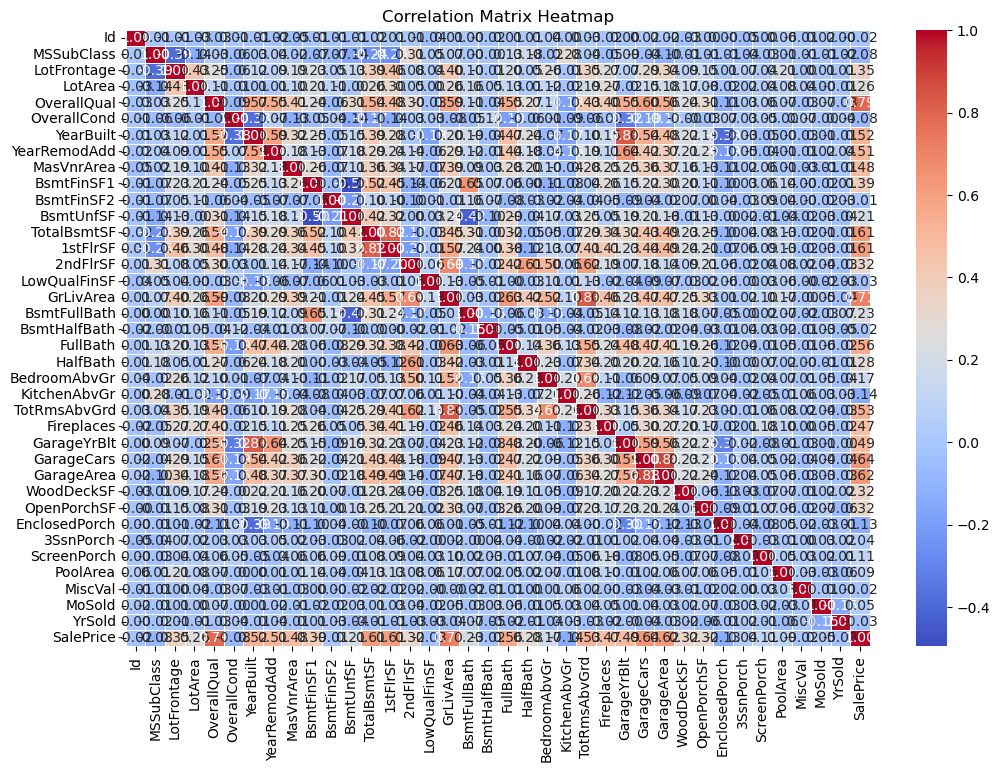

In [7]:
# Correlation matrix heatmap
correlation_matrix = housing_data[numerical_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


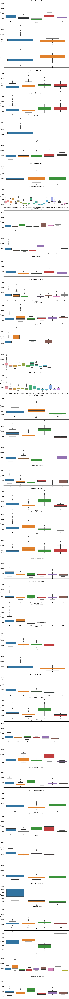

In [8]:
# Box plot for categorical features vs. SalePrice
categorical_cols = housing_data.select_dtypes(include=['object']).columns
plt.figure(figsize=(15, 5 * len(categorical_cols)))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(len(categorical_cols), 1, i)
    sns.boxplot(x=col, y='SalePrice', data=housing_data)
    plt.title(f'Box Plot of {col} vs. SalePrice')
plt.tight_layout()
plt.show()

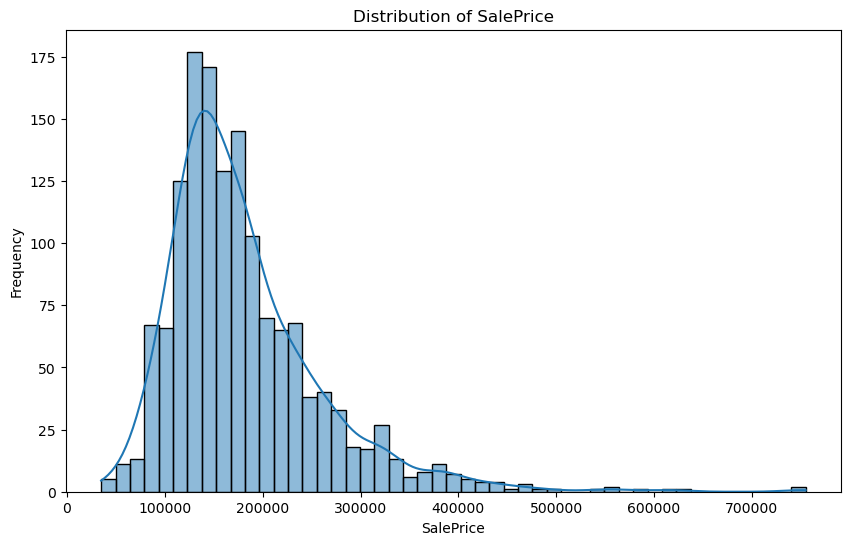

In [9]:
# Distribution of the target variable (SalePrice)
plt.figure(figsize=(10, 6))
sns.histplot(housing_data['SalePrice'], kde=True)
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.show()

In [10]:
# Preliminary Checks and Preprocessing
# Drop columns with more than 80% missing values
high_missing_cols = housing_data.columns[housing_data.isnull().mean() > 0.8]
housing_data = housing_data.drop(columns=high_missing_cols)

In [25]:
# Handling Missing Values and Outliers
threshold = 0.15
high_missing_cols = housing_data.columns[housing_data.isnull().mean() > threshold]
housing_data = housing_data.drop(columns=high_missing_cols)
housing_data = housing_data.dropna(subset=['SalePrice'])

In [26]:
# Separate target and features
X = housing_data.drop('SalePrice', axis=1)
y = housing_data['SalePrice']

In [27]:
# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

In [28]:
# Impute missing values
num_imputer = SimpleImputer(strategy='median')
cat_imputer = SimpleImputer(strategy='most_frequent')
X[numerical_cols] = num_imputer.fit_transform(X[numerical_cols])
X[categorical_cols] = cat_imputer.fit_transform(X[categorical_cols])

In [29]:
# One-Hot Encoding for Categorical Variables
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
encoded_cats = encoder.fit_transform(X[categorical_cols])

C:\Users\prathvi.bhatti\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [30]:
# Getting the feature names after one-hot encoding
encoded_cols = encoder.get_feature_names_out(categorical_cols)

In [31]:
# Create a DataFrame with the encoded columns
encoded_cats_df = pd.DataFrame(encoded_cats, columns=encoded_cols)

In [32]:
# Drop the original categorical columns and concatenate the DataFrames
X = X.drop(columns=categorical_cols)
X = pd.concat([X, encoded_cats_df], axis=1)

In [33]:
# Removing Outliers using Z-Score for numerical features
z_scores = np.abs((X[numerical_cols] - X[numerical_cols].mean()) / X[numerical_cols].std())
X = X[(z_scores < 3).all(axis=1)]
y = y[(z_scores < 3).all(axis=1)]

In [34]:
# Scaling Numerical Features
scaler = StandardScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

In [35]:
# Splitting Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
# Model Training with Hyperparameter Tuning

In [36]:
# Ridge Regression
ridge_params = {'alpha': np.logspace(-4, 4, 50)}
ridge_pipe = Pipeline([('scaler', StandardScaler()), ('ridge', Ridge())])
ridge_gs = GridSearchCV(ridge_pipe, {'ridge__alpha': ridge_params['alpha']}, scoring='neg_mean_squared_error', cv=5)
ridge_gs.fit(X_train, y_train)
ridge_best = ridge_gs.best_estimator_
print("Ridge Best Alpha:", ridge_gs.best_params_)

Ridge Best Alpha: {'ridge__alpha': 159.98587196060572}


In [40]:
# Lasso Regression
#It's taking some time ! please wait if it take longer than expected !!
lasso_params = {'alpha': np.logspace(-4, 4, 50)}
lasso_pipe = Pipeline([('scaler', StandardScaler()), ('lasso', Lasso(max_iter=100000))])
lasso_gs = GridSearchCV(lasso_pipe, {'lasso__alpha': lasso_params['alpha']}, scoring='neg_mean_squared_error', cv=5)
lasso_gs.fit(X_train, y_train)
lasso_best = lasso_gs.best_estimator_
print("Lasso Best Alpha:", lasso_gs.best_params_)

Lasso Best Alpha: {'lasso__alpha': 494.1713361323828}


In [41]:
# Model Evaluation
ridge_pred = ridge_best.predict(X_test)
lasso_pred = lasso_best.predict(X_test)
print("Ridge Test RMSE:", np.sqrt(mean_squared_error(y_test, ridge_pred)))
print("Ridge Test R²:", r2_score(y_test, ridge_pred))
print("Ridge Test MAE:", mean_absolute_error(y_test, ridge_pred))
print("Lasso Test RMSE:", np.sqrt(mean_squared_error(y_test, lasso_pred)))
print("Lasso Test R²:", r2_score(y_test, lasso_pred))
print("Lasso Test MAE:", mean_absolute_error(y_test, lasso_pred))

Ridge Test RMSE: 20522.029248977506
Ridge Test R²: 0.9123702746376812
Ridge Test MAE: 13051.344084768303
Lasso Test RMSE: 19310.19053154429
Lasso Test R²: 0.9224138924778763
Lasso Test MAE: 12071.581525296027


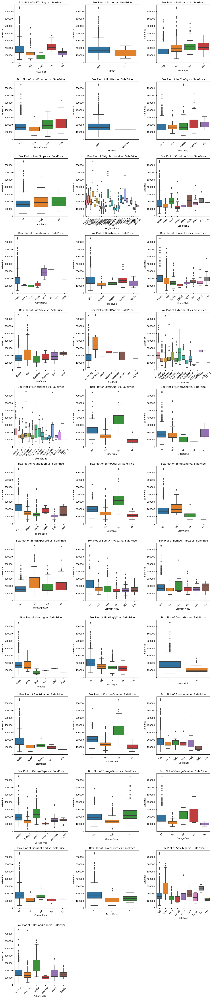

In [42]:
# Box plot for categorical features vs. SalePrice
categorical_cols = housing_data.select_dtypes(include=['object']).columns
num_cols = len(categorical_cols)
num_subplots = (num_cols // 3) + (num_cols % 3)

# Increase figure height
plt.figure(figsize=(14, num_subplots * 5))  # Adjust the multiplier as needed

for i, col in enumerate(categorical_cols, 1):
    plt.subplot(num_subplots, 3, i)
    sns.boxplot(x=col, y='SalePrice', data=housing_data)
    plt.title(f'Box Plot of {col} vs. SalePrice')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [43]:
# Feature Importance from Lasso Model
lasso_coefs = pd.Series(lasso_best.named_steps['lasso'].coef_, index=X_train.columns)
top_predictors = lasso_coefs.abs().sort_values(ascending=False).head(10)
print("Top 10 predictors from Lasso model:", top_predictors)

Top 10 predictors from Lasso model: GrLivArea               23110.143977
OverallQual              8447.138521
YearBuilt                8105.363656
BsmtFinSF1               6092.166832
KitchenQual_Ex           5544.104670
Neighborhood_NridgHt     5119.421564
TotalBsmtSF              4501.743882
BsmtQual_Ex              4344.396405
OverallCond              4016.586091
Neighborhood_StoneBr     3946.096435
dtype: float64


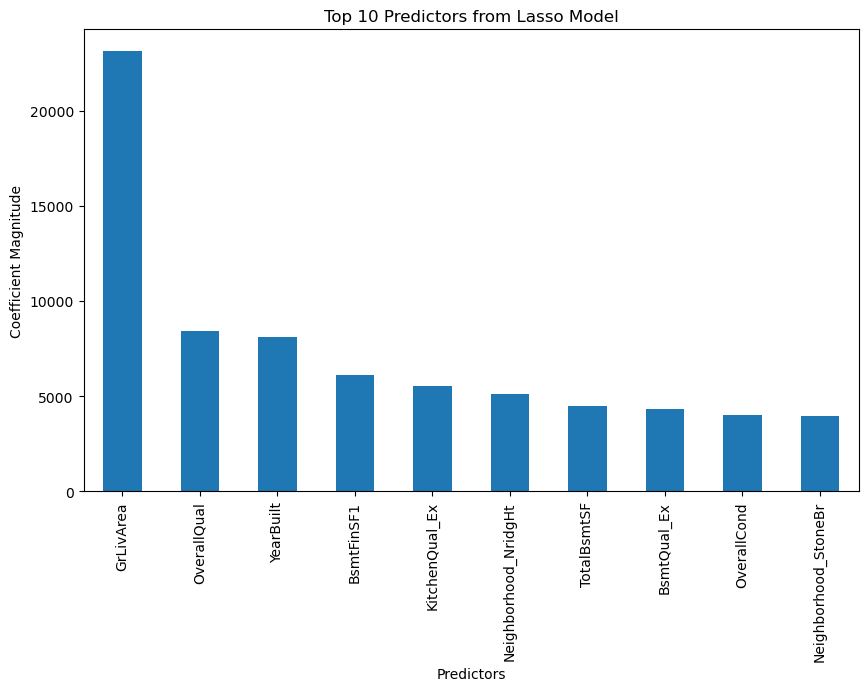

In [44]:
# Visualization of Feature Importance
plt.figure(figsize=(10, 6))
top_predictors.plot(kind='bar')
plt.title('Top 10 Predictors from Lasso Model')
plt.xlabel('Predictors')
plt.ylabel('Coefficient Magnitude')
plt.show()

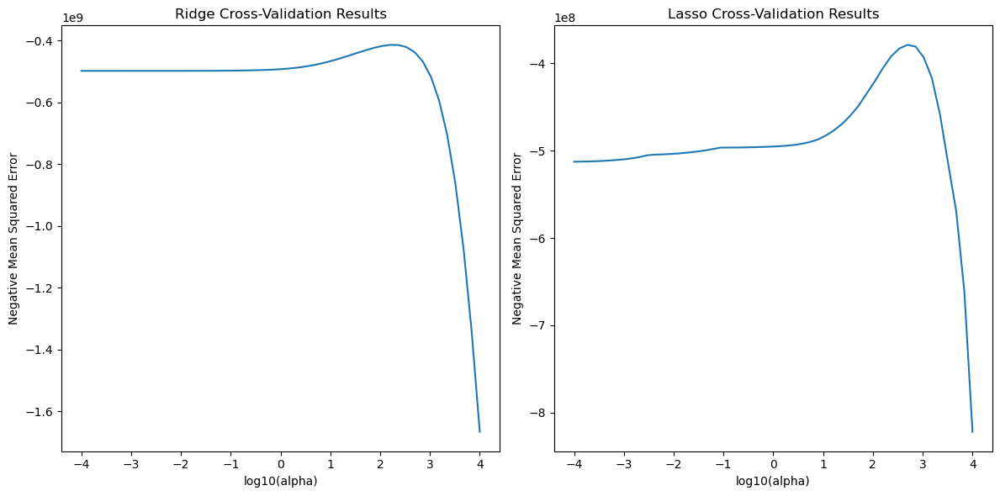

In [45]:
# Lambda/Optimal Alpha Visualization for Ridge and Lasso
ridge_results = pd.DataFrame(ridge_gs.cv_results_)
lasso_results = pd.DataFrame(lasso_gs.cv_results_)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(np.log10(ridge_params['alpha']), ridge_results['mean_test_score'])
plt.title('Ridge Cross-Validation Results')
plt.xlabel('log10(alpha)')
plt.ylabel('Negative Mean Squared Error')

plt.subplot(1, 2, 2)
plt.plot(np.log10(lasso_params['alpha']), lasso_results['mean_test_score'])
plt.title('Lasso Cross-Validation Results')
plt.xlabel('log10(alpha)')
plt.ylabel('Negative Mean Squared Error')

plt.tight_layout()
plt.show()

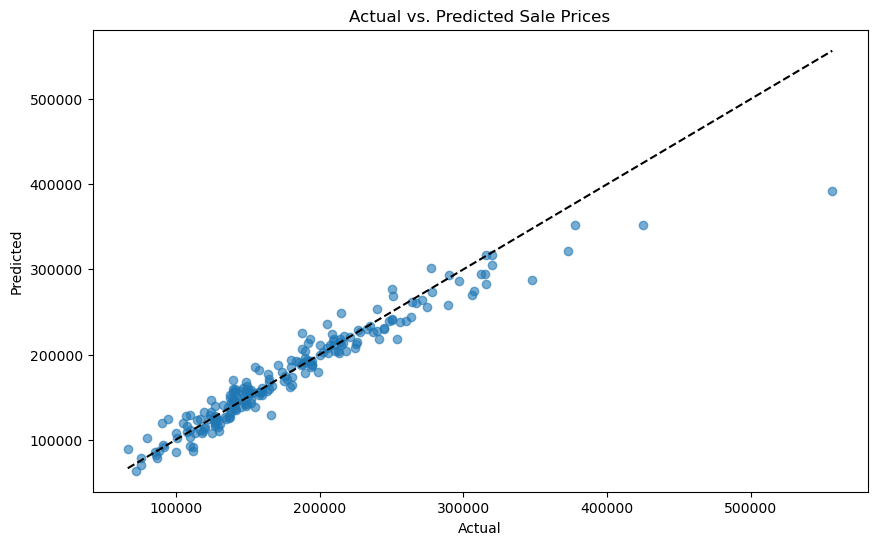

In [46]:
# Actual vs Predicted Prices
plt.figure(figsize=(10, 6))
plt.scatter(y_test, lasso_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--k')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted Sale Prices')
plt.show()